# Domaci zadatak 1 : Karplus-Strong sinteza zvuka
<b> Objavljen: 13.05.2024. godine <br>
<b> Rok za predaju: 27.05.2024.                                                 

<br>

## Sta je Karplus-Strong sintezator?
<b>Karplus-Strong</b>, poznat i kao “digitar” (od digitalna gitara) algoritam omogucava jednostavnu sintezu prilicno realisticnih tonova zicanih instrumenata.<br>
Osnovna blok-sema Karplus-Strong sintetizatora je prikazana na <i>Slici 1</i>.<br>
Vidimo da se sistem sastoji od :
1. <b>linije za kasnjenje duzine N</b>
2. <b>povratne veze</b> u kojoj se nalazi filtar cija je funkcija prenosa <i>Hd (z)</i>
$$
H_d(z) = \frac{1 + z^{-1}}{2}
$$
![Slika 1 : Osnovna blok sema Karplus-Strong sintetizatora](Slika1-Osnovna_blok_sema.png)
![Slika 2 : Osnovna blok sema Karplus-Strong sintetizatora](Slika2-Osnovna_blok_sema.png)

## Pobuda bijeli sum --> odziv kvaziperiodicni realistican signal
Sistem se pobuduje uzorkom <b>bijelog suma</b> duzine N odmjeraka.<br>
U slucaju <b>Karplus-Strong</b> sinteze u svakom “periodu” se uzorak signala u odredenoj mjeri promijeni koristenjem filtra u grani povratne veze<br>
![Slika 3 : U svakom periodu se uzorak signala mijenja](Slika3-U_svakom_periodu_se_uzorak_signala_mijenja.png)

cime se dobija <b>kvaziperiodicni</b> signal koji zvuci realisticnije
![Slika 4 : U svakom periodu se uzorak signala mijenja](Slika4-U_svakom_periodu_se_uzorak_signala_mijenja.png)<br>
## Osnovna frekvencija rezultujuceg tona 
Ukupno kasnjenje koje sistem unosi je N + 1/2  odmjeraka pa je osnovna frekvencija rezultujuceg tona jednaka
$$
F_0 = \frac{F_s}{N + \frac{1}{2}}
$$

Koristenjem izraza
$$
F_0 = \frac{F_s}{N + \frac{1}{2}}
$$
mozemo izracunati potrebnu duzinu linije za kasnjenje (N) za zeljenu osnovnu frekvenciju tona (Fo) i koristenu frekvenciju odmjeravanja(Fs).
<br>Medjutim, zbog ogranicenja da duzina linije za kasnjenje mora biti nenegativan cijeli broj, moze se desiti da ne mozemo sa 100% tacnoscu <br>
projektovati sistem sa zeljenom osnovnom frekvencijom (Fo) tj postoji mogucnost da se jave odstupanja od trazenje vrijednosti za Fo<br> 
Npr : 
$$
F_s = 1000 Hz
$$
$$
F_0 = 500 Hz
$$
$$
N = \frac{2F_s - F_o}{2F_o} = 1.5
$$

<br>
<br>

![Slika 5 : Povratna veza](povratna_veza.png)

## Kontrolisanje trajanja tona
Ocigledno je da je filtar u povratnoj vezi sistema zapravo <b>MA filtar</b> koji uzima svaka 2 susjedna odmjerka i <b>usrednji ih</b>. <b>Ovaj filtar pegla signal</b> te dobijamo signal koji ima finije, laganije promjene tj. eliminisu se veoma nagle promjene vrijednosti (skokovi signala).<br>
$$
H_d(z) = \frac{1 + z^{-1}}{2}
$$
<b>Problem?</b><br>
Nedostatak koristenja usrednjavanja u <b>2 tacke</b> u grani povratne veze je <b>nemogucnost precizne kontrole nad trajanjem tona</b>. Naime, originalni algoritam generise visoke tonove koji traju krace od dubokih tonova. Ovakvo ponasanje je ocekivano za zicane instrumente. Medutim, raspon izmedu trajanja dubokih i visokih tonova je prevelik tako da visoki tonovi traju vrlo kratko, a duboki neprirodno dugo.<br> 

len(H) =  512
len(w) =  512


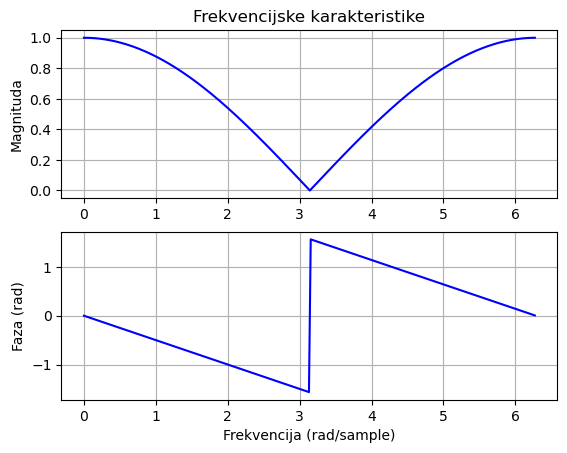

In [334]:
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np

b = [1, 1]
a = [2]
## H - Frekvencijska karakteristika H(e^jw) kao niz 512 kompleksnih brojeva
## w - niz od 512 digitalnih frekvencija, u rasponu od 0[rad/od] do 2*pi[rad/od]
w, H = signal.freqz(b, a, worN=512, whole=True) 

print('len(H) = ', len(H))
print('len(w) = ', len(w))

plt.figure()

# Magnituda
plt.subplot(2, 1, 1)
plt.plot(w, np.abs(H), 'b')
plt.title('Frekvencijske karakteristike')
plt.ylabel('Magnituda')
plt.grid()

# Faza
plt.subplot(2, 1, 2)
plt.plot(w, np.angle(H), 'b')
plt.ylabel('Faza (rad)')
plt.xlabel('Frekvencija (rad/sample)')
plt.grid()

<b>Rjesenje?</b><br>
Ako se usrednjavanje u dvije tacke zamijeni filtrom cija je funkcija prenosa oblika
$$ H_d (z) = \rho \left[ (1 - S) + S z^{-1} \right] $$
<b>trajanje tona se sada moze kontrolisati pomocu parametara</b> $$ 0 < \rho \leq 1  $$ $$ 0 < S < 1  $$ $$ \rho = 0.001^{1/(F_0 t_{60})}$$
$$ F_0 \quad \text{ - osnovna frekvencija tona ,  t60 - vrijeme za koje intenzitet tona opadne za 60dB}$$
$$ S \rightarrow 0 \quad \text{trajanje tona se produzava}$$
$$ S \rightarrow 1 \quad \text{trajanje tona se produzava}$$
$$ S \rightarrow 1/2 \quad \text{generisani ton ima najkrace trajanje}$$

<br>
<br>

## Uticaj mjesta na kojem se zice trzaju

Uticaj mjesta na kojem se zice trzaju moze sse modelovati filtriranjem ulaznog bijelog suma <b>cesljastim filtrom</b>
cija je funkcija prenosa 
$$
H_b (z) = 1 - z^{-\lfloor \beta N \rfloor} 
$$
Pozicija na zicama je odredjena parametrom $$ \beta \in \langle 0, 1 \rangle $$
![Slika 6 :  sintetizator sa cesljastim filtrom na ulazu](kkk.png)

## Overdrajv gitarski efekat
Cesto koristen nelinearni gitarski efekat u rok muzici je overdrajv koji se
postize koristenjem pojacavaca sa simetricnim zasicenjem. Staticka karakte ristika ovog nelinearnog efekta je data jednacinom
$$
f(x) =
\begin{cases} 
      -\frac{2}{3}, & \text{if } x \leq -1 \\
      x - \frac{x^3}{3}, & \text{if } -1 < x < 1 \\
      \frac{2}{3}, & \text{if } x \geq 1 
   \end{cases}
$$
                                        

![Slika 7 :  sintetizator konacna sema](aaa.png)

## Zakljucak

Karplus-Strong sintetizator je sistem koji nam omogucava da na sinteticki(vjestacki) nacin kreiramo tonove zicanih instrumenata 
1. zeljene osnovne frekvencije
2. zeljenog trajanja tona
3. zeljenog mjesta okidanja zice
<br>

![Slika 7 :  sintetizator konacna sema](aaa.png)

$$ \text{Ukupno kasnjenje koje sistem unosi odredjeno je duzinom linije za kasnjenje i iznosi} \quad N + 1/2 $$
$$ \text{Zeljena osnovna frekvencija rezultujuceg tona} \quad F_0 = \frac{F_s}{N + \frac{1}{2}} \text{ ; Fs - frekvencija odmjeravanja} $$
$$ \text{Trajanje tona se moze kontrolisati pomocu parametara } \quad 0 < \rho \leq 1 \text{ , } \quad 0 < S < 1 \text{     funkcije prenosa} \quad H_d (z) = \rho \left[ (1 - S) + S z^{-1} \right]$$
$$ \text{Uticaj mjesta na kojem se zice trzaju se modeluje preko} \quad H_b (z) = 1 - z^{-\lfloor \beta N \rfloor} , \beta \in \langle 0, 1 \rangle$$
$$ \text{Overdrajv se postize koristenjem pojacavaca sa simetricnim zasicenjem} $$

## Zadaci

<b>1. Odrediti funkciju prenosa za sistem prikazan na Slici 1 </b><br>
![Slika 1 : Osnovna blok sema Karplus-Strong sintetizatora](Slika1-Osnovna_blok_sema.png)

![Slika](viber_image_2024-05-19_13-57-25-540.jpg)

$$
H (z) = \frac{z^{-N}}{1-z^{-N}H_d(z)}
$$
$$
H(e^{jw}) = H(z)| _{z = e^{jw}} = \frac{e^{-jwN}}{1-e^{-jwN}H_d(e^{jw})} = \frac{B(e^{jw})}{A(e^{jw})}
$$
$$
\text {Za} \quad H_d(z) = \frac{1 + z^{-1}}{2}
$$
$$
H(e^{jw}) = \frac{e^{-jwN}}{1-e^{-jwN}H_d(e^{jw})} = \frac{e^{-jwN}}{1-e^{-jwN}(\frac{1}{2} + \frac{1}{2}e^{-jw})} 
=\frac{e^{-jwN}}{1 - \frac{1}{2}e^{-jwN} - \frac{1}{2}e^{-jw(N+1)}}
$$

Amplitudna i fazna karakteristika sistema sa Slike 1 :

len(H) =  512
len(w) =  512


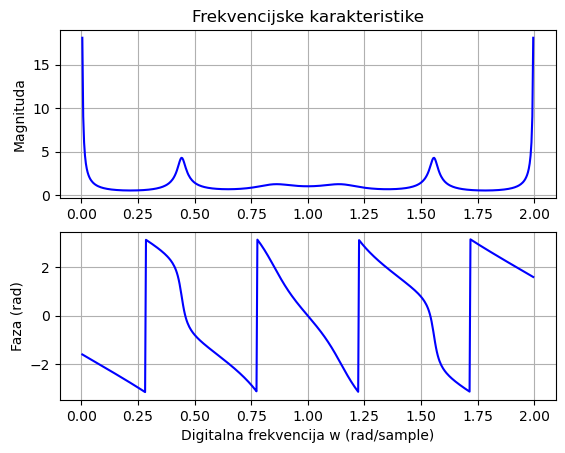

In [335]:
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np

# Definisanje duzine linije za kasnjenje za primjer
N = 4

b = [0] * N + [1]
a = [1] + [0] * (N - 1) + [-0.5, -0.5]

## H - Frekvencijska karakteristika H(e^jw) kao niz 512 kompleksnih brojeva
## w - niz od 512 digitalnih frekvencija, u rasponu od 0[rad/od] do 2*pi[rad/od]
w, H = signal.freqz(b, a, worN=512, whole=True) 

print('len(H) = ', len(H))
print('len(w) = ', len(w))

plt.figure()

# Magnituda
plt.subplot(2, 1, 1)
plt.plot(w/math.pi, np.abs(H), 'b')                  
plt.title('Frekvencijske karakteristike')
plt.ylabel('Magnituda')
plt.grid()

# Faza
plt.subplot(2, 1, 2)
plt.plot(w/math.pi, np.angle(H), 'b')
plt.ylabel('Faza (rad)')
plt.xlabel('Digitalna frekvencija w (rad/sample)')
plt.grid()

2. <b>Nacrtati amplitudnu i faznu karakteristiku sistema za sintezu tona A iz cetvrte oktave cija je frekvencija 440 Hz i frekvenciju odmjeravanja od 48 kHz. Frekvencijsku osu oznaciti u Hercima. Polazeci od znanja o obliku spektra pobudnog signala (bijeli sum), komentarisati zasto je ovaj sistem pogodan za sintezu tonova.</b>

$$ \text{Iz izraza} \quad F_0 = \frac{F_s}{N + \frac{1}{2}}$$
$$ \text{mozemo da izvedemo sledece} \quad N = \frac{2F_s - F_o}{2F_o} = \frac{2*48000 - 440}{2*440} = 108,590909$$

U ovom primjeru ocigledno nailazimo na problem ogranicenja da duzina linije za kasnjenje mora biti pozitivna cjelobrojna vrijednost. 
Ne mozemo realizovati sintetizator tona A na tacnoj frekvenciji od 440Hz, ali zato mozemo realizovati ton vrlo bliske frekvencije <br>
$$ \text{Za N = 109 : } \quad F_0 = \frac{F_s}{N + \frac{1}{2}} = \frac{48000Hz}{109.5} = 438.356164 Hz$$
$$ \text{Relativna greska} \quad \epsilon_r = \frac{\left| \bar{x} - x_i \right|}{\bar{x}} = \frac{440 - 438.356164}{440} = 0.003735991$$

$$ H(e^{jw}) =\frac{e^{-jwN}}{1 - \frac{1}{2}e^{-jwN} - \frac{1}{2}e^{-jw(N+1)}} $$

len(H) =  512
len(w) =  512


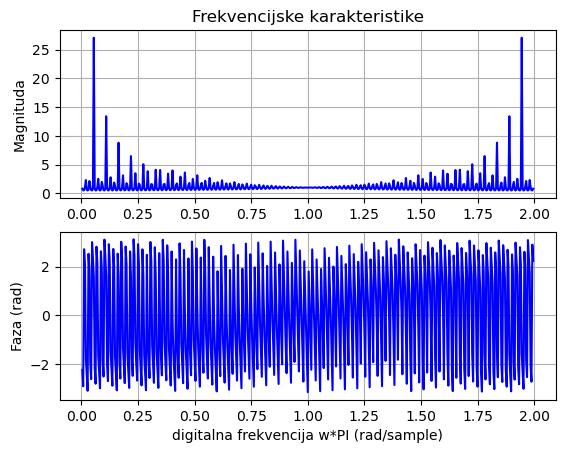

In [336]:
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
import math

# duzina linije za kasnjenje
N = 109

b = [0] * N + [1]
a = [1] + [0] * (N - 1) + [-0.5, -0.5]

## H - Frekvencijska karakteristika H(e^jw) kao niz 512 kompleksnih brojeva
## w - niz od 512 digitalnih frekvencija, u rasponu od 0[rad/od] do 2*pi[rad/od]
w, H = signal.freqz(b, a, worN=512, whole=True) 

print('len(H) = ', len(H))
print('len(w) = ', len(w))

plt.figure()

# Magnituda
plt.subplot(2, 1, 1)
plt.plot(w/math.pi, np.abs(H), 'b')       # w[rad/od] je digitalna frekvecija koja uzima vrijednosti 0[rad/od] do 2*PI[rad/od] tj
plt.title('Frekvencijske karakteristike') # 0 < w < 6.28 [rad/od] tako da je apscisa samo normalizovana po PI tako da lakse citamo
plt.ylabel('Magnituda')                   # vrijednosti 0, ..., PI, ..., 2PI 
plt.grid()

# Faza
plt.subplot(2, 1, 2)
plt.plot(w/math.pi, np.angle(H), 'b')
plt.ylabel('Faza (rad)')
plt.xlabel('digitalna frekvencija w*PI (rad/sample)')
plt.grid()

![Slika](viber_image_2024-05-19_20-59-35-169.jpg)

In [337]:
fs = 48000

f = w * fs / (2*math.pi) # Hz
print(len(f))
print(w)           # 0 - 2*PI=6.28  [rad/od]
print(w/math.pi)   # 0 - 2          [rad/od]
print(f)           # 0 - 47 906     [Hz]

512
[0.         0.01227185 0.02454369 0.03681554 0.04908739 0.06135923
 0.07363108 0.08590292 0.09817477 0.11044662 0.12271846 0.13499031
 0.14726216 0.159534   0.17180585 0.18407769 0.19634954 0.20862139
 0.22089323 0.23316508 0.24543693 0.25770877 0.26998062 0.28225246
 0.29452431 0.30679616 0.319068   0.33133985 0.3436117  0.35588354
 0.36815539 0.38042724 0.39269908 0.40497093 0.41724277 0.42951462
 0.44178647 0.45405831 0.46633016 0.47860201 0.49087385 0.5031457
 0.51541754 0.52768939 0.53996124 0.55223308 0.56450493 0.57677678
 0.58904862 0.60132047 0.61359232 0.62586416 0.63813601 0.65040785
 0.6626797  0.67495155 0.68722339 0.69949524 0.71176709 0.72403893
 0.73631078 0.74858262 0.76085447 0.77312632 0.78539816 0.79767001
 0.80994186 0.8222137  0.83448555 0.84675739 0.85902924 0.87130109
 0.88357293 0.89584478 0.90811663 0.92038847 0.93266032 0.94493217
 0.95720401 0.96947586 0.9817477  0.99401955 1.0062914  1.01856324
 1.03083509 1.04310694 1.05537878 1.06765063 1.07992247 1.0

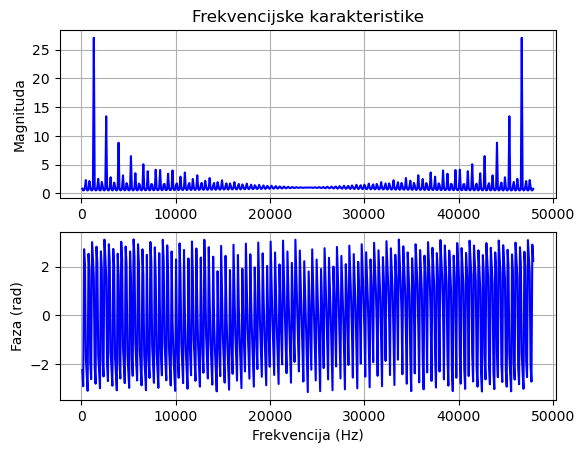

In [338]:
plt.figure()

# Magnituda
plt.subplot(2, 1, 1)
plt.plot(f, np.abs(H), 'b')               # w[rad/od] je digitalna frekvecija koja uzima vrijednosti 0[rad/od] do 2*PI[rad/od] tj
plt.title('Frekvencijske karakteristike') # 0 < w < 6.28 [rad/od] tako da je apscisa samo normalizovana po PI tako da lakse citamo
plt.ylabel('Magnituda')                   # vrijednosti 0, ..., PI, ..., 2PI 
plt.grid()

# Faza
plt.subplot(2, 1, 2)
plt.plot(f, np.angle(H), 'b')
plt.ylabel('Faza (rad)')
plt.xlabel('Frekvencija (Hz)')
plt.grid()

Bijeli sum predstavalja širokopojasni šum kojem je spektralna gustina neovisna o frekvenciji.
Bijeli sum ima istu gustinu energije u svakom frekvencijskom dijapazonu. To znači da je ista zvučna energija u rasponu 100-200 Hz kao u rasponu od 3100-3200 Hz. Prema tome, na linearnoj frekvencijskoj skali, oblik spektra bijelog šuma je ravna linija.

![Bijeli sum](bijeli.gif)

Bijeli sum sadrzi sve frekvencije te imamo vise sadrzaja/materijala za rad. Filter u grani povratne veze u svakom periodu promijeni uzorak signala u odredjenoj mjeri. Sirok spektar frekvencija bijelog suma znaci da rezultujuci zvuk moze biti modelovan/aranziran u sirok spektar tonova. Da je koristen npr. Brown sum kome manjka visokih frekvencija, dobili bismo dosta mracan zvuk sa slabim visokim harmonicima i izrazenim dubokim tonovima (niskim harmonicima), time bi zvuk izgubio na realizmu i svjetlini.


<b>3. Napisati funkciju u Pythonu koja, koristenjem Karplus-Strong algoritma, generise ton zadate frekvencije (u Hercima) i
trajanja (u sekundama) za datu frekvenciju odmjeravanja (u Hercima)

$$ y(n) = w(n - N) $$
$$ w(n) = x(n) + y(n)*hd(n) = x(n) + y(n)*[\rho (1-S) \delta(n) + \rho S \delta(n-1)] $$
$$ ... $$
$$ y(n) = x(n-N) + \rho (1-S) y(n-N) + \rho S y(n-N-1) $$

In [339]:
import numpy as np

def ton_generator(fo, fs, to, rho=0.99, S=0.01):
    # Broj odmjeraka za jedan period
    N = int((2*fs - fo)/(2*fo))
    
    # Generisanje bijelog suma duzine N odmjeraka
    x = np.random.normal(0, 1, N)
    
    # Ukupan broj odmjeraka
    num_samples = int(fs * to)

    # Izlazni bafer
    y = np.zeros(num_samples)
    
    for i in range(num_samples):
        current_index  = i % N
        previous_index = (i - 1) % N
        y[i] = x[current_index]
        
        next_value = rho * ((1 - S) * x[current_index] + S * x[previous_index])
        x[current_index] = next_value

    return y

<b>4. Testirati funkciju iz prethodne tacke na primjeru generisanja tona A iz
cetvrte oktave. Koristiti frekvenciju odmjeravanja od 48 kHz. Reprodukovati ton. Trajanje tona treba da bude 1 sekunda. Nacrtati talasni
oblik generisanog signala (kao kontinualni signal) sa vremenskom osom
oznacenom u sekundama. Nacrtati amplitudni spektar generisanog signala sa frekvencijskom osom oznacenom u Hercima.

Text(0, 0.5, 'Amplituda')

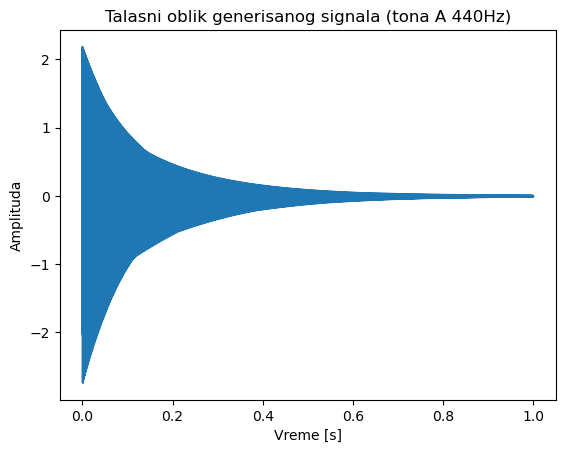

In [340]:
import matplotlib.pyplot as plt
import numpy as np

fo = 440
fs = 48000
to = 1

n = np.arange(int(fs*to))
y = ton_generator(fo, fs, to)

plt.figure()
plt.plot(n/fs,y)
plt.title('Talasni oblik generisanog signala (tona A 440Hz)')
plt.xlabel('Vreme [s]')
plt.ylabel('Amplituda')

In [341]:
from scipy.io import wavfile
from IPython.display import Audio

wavfile.write('ton_A.wav', fs, y)

# TON A
fs, ton_A = wavfile.read('ton_A.wav')
Audio(ton_A, rate=fs)

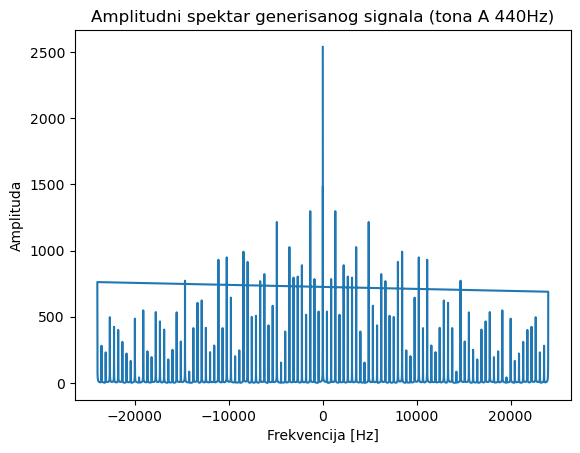

In [342]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.fftpack import fft, fftfreq
import math

fft_out  = np.fft.fft(ton_A)                  # racuna DFT
fft_freq = np.fft.fftfreq(len(ton_A), 1 / fs) # vraca frekvencije odmjeraka DFT-a (niz duzine len(ton_A))

# Amplitudni spektar
plt.plot(fft_freq, np.abs(fft_out))
plt.title('Amplitudni spektar generisanog signala (tona A 440Hz)')
plt.xlabel('Frekvencija [Hz]')
plt.ylabel('Amplituda')
plt.show()

<b>5. Napisati kod u Pythonu koji, koristenjem funkcije iz tacke 3, generise
C-dur ljestvicu. Frekvencije tonova i formulu za njihovo izracunavanje
mozete naci na https://en.wikipedia.org/wiki/Piano_key_frequencies.
Reprodukovati generisani signal i sacuvati ga u WAV fajlu. Kolike su
stvarne frekvencije tonova ljestvice generisanih realizovanim sintetizatorom?

C dur ljestvica je durska ljestvica bez predznaka. Po abecedi, tonovi koji cine C dur ljestvicu se citaju : c d e f g a h c. Ako izaberemo cetvrtu oktavu : <br>
C4 = 261.6256 Hz <br>
D4 = 293.6648 Hz <br>
E4 = 329.6276 Hz <br>
F4 = 349.2282 Hz <br>
G4 = 391.9954 Hz <br>
A4 = 440.0000 Hz <br>
B4 = 493.8833 Hz <br>
C5 = 523.2511 Hz <br>

In [343]:
from scipy.io import wavfile
from IPython.display import Audio
import numpy as np

to = 1
fs = 48000
fos = [261.6256, 293.6648, 329.6276, 349.2282, 391.9954, 440.0000, 493.8833, 523.2511]
output = []
for fo in fos:
    y = ton_generator(fo, fs, to)
    output = np.append(output, y, axis=None)
    
wavfile.write('C_dur.wav', fs, output)

fs, C_dur = wavfile.read('C_dur.wav')
Audio(C_dur, rate=fs)

<b>6. Napisati funkciju u Pythonu kojom je implementiran Karplus-Strong
sintetizator sa filtrom u grani povratne sprege kojim je moguce kontrolisati trajanje tona. Pored zadate frekvencije tona, njegovog trajanja i frekvencije odmjeravanja, ulazni argumenti ove funkcije treba da budu
i parametri t60 i S.

In [344]:
import numpy as np

def ton_generator(fo, fs, to, rho=0.99, S=0.01):
    # Broj odmjeraka za jedan period
    N = int((2*fs - fo)/(2*fo))

    # Ukupan broj odmjeraka
    num_samples = int(fs * to)
    
    # Generisanje bijelog suma duzine N odmjeraka
    x = np.random.normal(0, 1, N)

    # Izlazni bafer
    y = np.zeros(num_samples)
    
    for i in range(num_samples):
        current_index  = i % N
        previous_index = (i - 1) % N
        y[i] = x[current_index]
        
        next_value = rho * ((1 - S) * x[current_index] + S * x[previous_index])
        x[current_index] = next_value

    return y

<b>7. Demonstrirati uticaj parametara t60 i S na trajanje tonova C-dur ljestvice.

Za demonstraciju uticaja parametara t60 i S bice koristen ton A 440Hz

Text(0, 0.5, 'Amplituda')

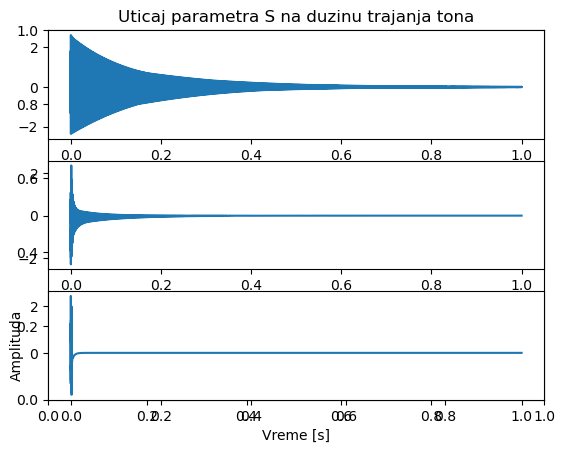

In [345]:
import matplotlib.pyplot as plt
import numpy as np

fs = 48000
fo = 440
to = 1
n = np.arange(int(fs*to))

a1 = ton_generator(fo, fs, to, rho=0.99, S=0.01)
a2 = ton_generator(fo, fs, to, rho=0.99, S=0.5)
a3 = ton_generator(fo, fs, to, rho=0.99, S=0.99)

plt.figure()

plt.title('Uticaj parametra S na duzinu trajanja tona')

plt.subplot(3,1,1)
plt.plot(n/fs,a1)

plt.subplot(3,1,2)
plt.plot(n/fs,a2)

plt.subplot(3,1,3)
plt.plot(n/fs,a3)

plt.xlabel('Vreme [s]')
plt.ylabel('Amplituda')

Text(0, 0.5, 'Amplituda')

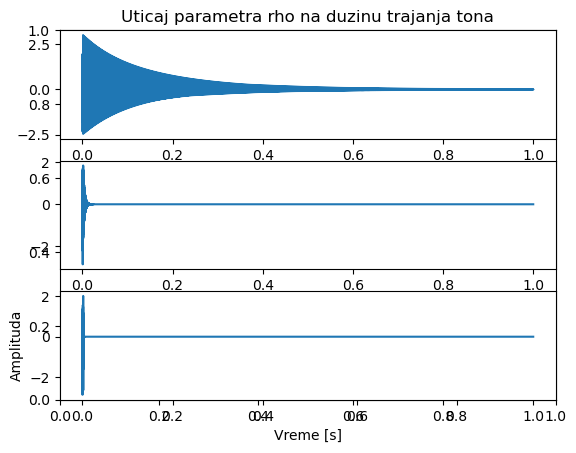

In [346]:
import matplotlib.pyplot as plt
import numpy as np

fs = 48000
fo = 440
to = 1
n = np.arange(int(fs*to))

a4 = ton_generator(fo, fs, to, rho=0.99, S=0.01)
a5 = ton_generator(fo, fs, to, rho=0.5, S=0.01)
a6 = ton_generator(fo, fs, to, rho=0.01, S=0.01)

plt.figure()

plt.title('Uticaj parametra rho na duzinu trajanja tona')

plt.subplot(3,1,1)
plt.plot(n/fs,a4)

plt.subplot(3,1,2)
plt.plot(n/fs,a5)

plt.subplot(3,1,3)
plt.plot(n/fs,a6)

plt.xlabel('Vreme [s]')
plt.ylabel('Amplituda')

$$ \rho = 0.001^{\left(\frac{1}{F_0t_60}\right)} $$


Da bi trajanje tona bilo sto duze, $t_{60}$ mora biti sto vece. To nas dovodi do zakljucka :<br>
Sto je $\rho$ blizi 1, to je trajanje tona duze <br>
Sto je $\rho$ blizi 0, to je trajanje tona krace<br>

Da bi trajanje tona bilo sto duze, $S$ mora biti sto manje. To nas dovodi do zakljucka :<br>
Sto je $S$ blizi 1, to je trajanje tona krace <br>
Sto je $S$ blizi 0, to je trajanje tona duze<br>

In [347]:
from scipy.io import wavfile
from IPython.display import Audio
import numpy as np

fs = 48000
fo = 440
to = 1

output_kratki = ton_generator(fo, fs, to, rho=0.01, S=0.99)
output_dugi   = ton_generator(fo, fs, to, rho=0.99, S=0.01)

wavfile.write('A440Hz_kratki.wav', fs, output_kratki)
wavfile.write('A440Hz_dugi.wav', fs, output_dugi)

fs, A440Hz_kratki = wavfile.read('A440Hz_kratki.wav')
Audio(A440Hz_kratki, rate=fs)

In [348]:
fs, A440Hz_dugi = wavfile.read('A440Hz_dugi.wav')
Audio(A440Hz_dugi, rate=fs)

<b>8. Polozaj trzalice na zicama se moze kontrolisati tako sto se kao pobudni signal ne koristi bijeli sum vec signal dobijen filtriranjem bijelog suma cesljastim FIR filtrom cija je funkcija prenosa $H_b(z)$. Modifikovati funkciju iz tacke 6 tako da se ulazni signal prvo filtrira cesljastim FIR filtrom. Parametar β treba da bude dodatni ulazni argument ove funkcije, pored vec postojecih.

![Slikaa](trzanje.png)
$$ \text{Uticaj mjesta na kojem se zice trzaju se modeluje   preko ->  } \quad H_b (z) = 1 - z^{-\lfloor \beta N \rfloor} , \beta \in \langle 0, 1 \rangle$$
$$
Z^{−1}(H_b(z)) = Z^{−1}(1 - z^{-\lfloor \beta N \rfloor}) = δ[n]−δ[n−⌊βN⌋] --> h_b[n]=δ[n]−δ[n−⌊βN⌋]
$$

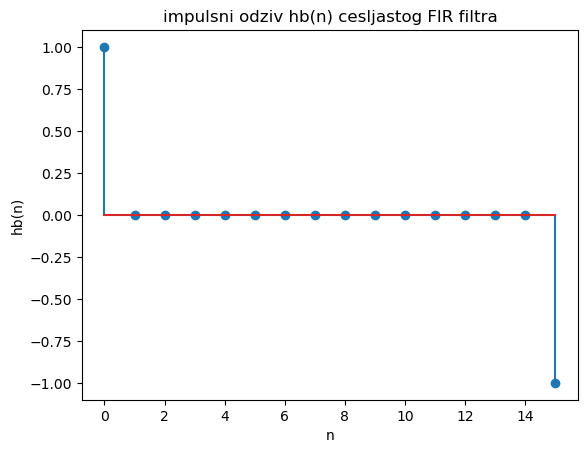

In [349]:
import numpy as np
import matplotlib.pyplot as plt 

N = 30
beta = 0.5

delay = int(np.floor(beta * N))
n = np.arange(delay + 1)

hb = [1] + [0] * (delay - 1) + [-1]

plt.stem(n, hb)
plt.title('impulsni odziv hb(n) cesljastog FIR filtra')
plt.xlabel('n')
plt.ylabel('hb(n)')
plt.show()

In [350]:
import numpy as np

def ton_generator_sa_polozajem_trzalice(fo, fs, to, beta = 0.5, rho=0.99, S=0.01):
    # Broj odmjeraka za jedan period
    N = int((2*fs - fo)/(2*fo))

    # Ukupan broj odmjeraka
    num_samples = int(fs * to)
    
    # Generisanje bijelog suma duzine N odmjeraka
    noise = np.random.normal(0, 1, N)

    # Izračunaj poziciju za drugi impuls
    delay = int(np.floor(beta * N))
    
    # impulsni odziv cesljastog FIR filtra
    hb = [1] + [0] * (delay - 1) + [-1]
    
    x = np.convolve(noise, hb, mode='full')
    
    # Izlazni bafer
    y = np.zeros(num_samples)
    
    for i in range(num_samples):
        current_index  = i % N
        previous_index = (i - 1) % N
        y[i] = x[current_index]
        
        next_value = rho * ((1 - S) * x[current_index] + S * x[previous_index])
        x[current_index] = next_value

    return y

<b>9. Demonstrirati uticaj vrijednosti parametra β ∈ {0.01, 0.1, 0.5, 0.9} na tonove C-dur ljestvice.

In [351]:
from scipy.io import wavfile
from IPython.display import Audio
import numpy as np

fs = 48000
to = 1 
fos = [261.6256, 293.6648, 329.6276, 349.2282, 391.9954, 440.0000, 493.8833, 523.2511]
output = []

for fo in fos:
    y = ton_generator_sa_polozajem_trzalice(fo, fs, to, beta=0.01)
    output = np.append(output, y, axis=None)
    
wavfile.write('C_dur_b1.wav', fs, output)

fs, C_dur_b1 = wavfile.read('C_dur_b1.wav')
Audio(C_dur_b1, rate=fs)

In [352]:
from scipy.io import wavfile
from IPython.display import Audio
import numpy as np

fs = 48000
to = 1
fos = [261.6256, 293.6648, 329.6276, 349.2282, 391.9954, 440.0000, 493.8833, 523.2511]
output = []

for fo in fos:
    y = ton_generator_sa_polozajem_trzalice(fo, fs, to, beta=0.1)
    output = np.append(output, y, axis=None)
    
wavfile.write('C_dur_b2.wav', fs, output)

fs, C_dur_b2 = wavfile.read('C_dur_b2.wav')
Audio(C_dur_b2, rate=fs)

In [353]:
from scipy.io import wavfile
from IPython.display import Audio
import numpy as np

fs = 48000
to = 1
fos = [261.6256, 293.6648, 329.6276, 349.2282, 391.9954, 440.0000, 493.8833, 523.2511]
output = []

for fo in fos:
    y = ton_generator_sa_polozajem_trzalice(fo, fs, to, beta=0.5)
    output = np.append(output, y, axis=None)
    
wavfile.write('C_dur_b3.wav', fs, output)

fs, C_dur_b3 = wavfile.read('C_dur_b3.wav')
Audio(C_dur_b3, rate=fs)

In [354]:
from scipy.io import wavfile
from IPython.display import Audio
import numpy as np

fs = 48000
to = 1
fos = [261.6256, 293.6648, 329.6276, 349.2282, 391.9954, 440.0000, 493.8833, 523.2511]
output = []

for fo in fos:
    y = ton_generator_sa_polozajem_trzalice(fo, fs, to, beta=0.9)
    output = np.append(output, y, axis=None)
    
wavfile.write('C_dur_b4.wav', fs, output)

fs, C_dur_b4 = wavfile.read('C_dur_b4.wav')
Audio(C_dur_b4, rate=fs)

Cujemo da je za $\beta = 0.01$ ton veoma tanak i staklast jer se simulira okidanje zice daleko od rupe na gitari(blizu kobilice).
Kako povecavamo $\beta$ tako je ton sve puniji i puniji cime simuliramo blizinu mjesta okidanja zice rupi na gitari

<b>10. Modifikovati funkciju iz tacke 8 tako da ukljucuje implementaciju overdrajv efekta sa pojacanjem g koje se moze zadati kao ulazni argument.

In [355]:
import numpy as np

def ton_generator_sa_overdrajvom(fo, fs, to, beta = 0.5, g = 5, rho=0.99, S=0.01):
    # Broj odmjeraka za jedan period
    N = int((2*fs - fo)/(2*fo))

    # Ukupan broj odmjeraka
    num_samples = int(fs * to)
    
    # Generisanje bijelog suma duzine N odmjeraka
    noise = np.random.normal(0, 1, N)

    # Izračunaj poziciju za drugi impuls
    delay = int(np.floor(beta * N))
    
    # impulsni odziv cesljastog FIR filtra
    hb = [1] + [0] * (delay - 1) + [-1]
    
    x = np.convolve(noise, hb, mode='full')
    
    # Izlazni bafer
    y = np.zeros(num_samples)
    
    for i in range(num_samples):
        current_index  = i % N
        previous_index = (i - 1) % N
        y[i] = x[current_index]
        
        next_value = rho * ((1 - S) * x[current_index] + S * x[previous_index])
        x[current_index] = next_value

    output_temp = y*g

    output = np.zeros(num_samples)
    
    i = 0
    
    for x in output_temp:
        if x <= -1:
            output[i] = -2/3
        elif x >= 1:
            output[i] = 2/3
        else:
            output[i] = x - ((x*x*x)/3)
        i+=1
        
    return output

<b>11. Na tonovima C-dur ljestvice demonstrirati overdrajv efekat sa pojacanjem g = 1000 prije nelinearnosti

In [356]:
import numpy as np

def ton_generator_prije_nelinearnosti(fo, fs, to, beta = 0.5, g = 5, rho=0.99, S=0.01):
    # Broj odmjeraka za jedan period
    N = int((2*fs - fo)/(2*fo))

    # Ukupan broj odmjeraka
    num_samples = int(fs * to)
    
    # Generisanje bijelog suma duzine N odmjeraka
    noise = np.random.normal(0, 1, N)

    # Izračunaj poziciju za drugi impuls
    delay = int(np.floor(beta * N))
    
    # impulsni odziv cesljastog FIR filtra
    hb = [1] + [0] * (delay - 1) + [-1]
    
    x = np.convolve(noise, hb, mode='full')
    
    # Izlazni bafer
    y = np.zeros(num_samples)
    
    for i in range(num_samples):
        current_index  = i % N
        previous_index = (i - 1) % N
        y[i] = x[current_index]
        
        next_value = rho * ((1 - S) * x[current_index] + S * x[previous_index])
        x[current_index] = next_value

    return (y*g)
        

In [357]:
                                                        # C DUR PRIJE NELINEARNOSTI
from scipy.io import wavfile
from IPython.display import Audio
import numpy as np

fs = 48000
to = 1
fos = [261.6256, 293.6648, 329.6276, 349.2282, 391.9954, 440.0000, 493.8833, 523.2511]
output = []

for fo in fos:
    y = ton_generator_prije_nelinearnosti(fo, fs, to, beta = 0.5, g = 1000, rho=0.99, S=0.01)
    output = np.append(output, y, axis=None)
    
wavfile.write('C_dur_prije_nelinearnosti.wav', fs, output)

fs, C_dur_prije_nelinearnosti = wavfile.read('C_dur_prije_nelinearnosti.wav')
Audio(C_dur_prije_nelinearnosti, rate=fs)

In [358]:
                                                        # C DUR NAKON NELINEARNOSTI

from scipy.io import wavfile
from IPython.display import Audio
import numpy as np

fs = 48000
to = 1
fos = [261.6256, 293.6648, 329.6276, 349.2282, 391.9954, 440.0000, 493.8833, 523.2511]
output = []

for fo in fos:
    y = ton_generator_sa_overdrajvom(fo, fs, to, 0.5, 1000)
    output = np.append(output, y, axis=None)
    
wavfile.write('C_dur_poslije_nelinearnosti.wav', fs, output)

fs, C_dur_poslije_nelinearnosti = wavfile.read('C_dur_poslije_nelinearnosti.wav')
Audio(C_dur_poslije_nelinearnosti, rate=fs)

<b>12. Napisati funkciju koja koristenjem neke od funkcija iz tacaka 6, 8 ili 10 generise akord koji se sastoji od tonova zadatih frekvencija. Akord na gitari se moze posmatrati kao niz tonova odsviranih istovremeno uz malo kasnjenje pocetaka pojedinih tonova.

In [359]:
import numpy as np

def ton_generator(fo, fs, to, rho=0.99, S=0.01):
    # Broj odmjeraka za jedan period
    N = int((2*fs - fo)/(2*fo))

    # Ukupan broj odmjeraka
    num_samples = int(fs * to)
    
    # Generisanje bijelog suma duzine N odmjeraka
    x = np.random.normal(0, 1, N)

    # Izlazni bafer
    y = np.zeros(num_samples)
    
    for i in range(num_samples):
        current_index  = i % N
        previous_index = (i - 1) % N
        y[i] = x[current_index]
        
        next_value = rho * ((1 - S) * x[current_index] + S * x[previous_index])
        x[current_index] = next_value

    return y

def akord_generator(frequencies, fs, to, rho=0.99, S=0.01, delay=0.01):
    
    num_samples = int(fs * to)
    
    akord = np.zeros(num_samples)
    
    for i, fo in enumerate(frequencies):
        ton = ton_generator(fo, fs, to, rho, S)
        delay_samples = int(fs * delay * i)
        if delay_samples >= num_samples:
            break
        akord[delay_samples:delay_samples + len(ton)] += ton[:num_samples - delay_samples]
    
    return akord

D mol (D3 D4 F4 A4)
A mol (A C E)

In [360]:
akord_dmol = akord_generator([146.8324, 440.0, 293.6648, 349.2282], 48000, 2)

wavfile.write('dmol.wav', fs, akord_dmol)

fs, dmol = wavfile.read('dmol.wav')
Audio(dmol, rate=fs)

In [361]:
akord_amol = akord_generator([220.00, 329.6276, 440.00, 261.6256], 48000, 2)

wavfile.write('amol.wav', fs, akord_amol)

fs, amol = wavfile.read('amol.wav')
Audio(amol, rate=fs)

<b>13. Koristenjem sintetizatora realizovanog u nekoj od tacaka 6, 8 ili 10 odsvirati kompletnu kompoziciju. Moguci primjeri su kompozicije sa http://arcadetones.emuunlim.com/, ali mozete izabrati i sopstvenu

In [362]:
from scipy.io import wavfile
from IPython.display import Audio
import numpy as np

E5  = 659.2551
Eb5 = 622.2540
B4  = 493.8833
C5  = 523.2511
A4  = 440.00
D5  = 587.3295
E3  = 164.8138
C4  = 261.6256 
E4  = 329.6276
B4  = 493.8833
Ab4 = 415.3047


notes1 = [E5, Eb5, E5, Eb5, E5, B4, D5, C5]
notes2 = [C4, E4, A4]
notes3 = [E3, E4, Ab4, B4]

output = []

for fo in notes1:
    y = ton_generator_sa_polozajem_trzalice(fo, 48000, 0.5, 0.9)
    output = np.append(output, y, axis=None)

y = ton_generator_sa_polozajem_trzalice(A4, 48000, 1, 0.9)
output = np.append(output, y, axis=None)

y = ton_generator_sa_polozajem_trzalice(E3, 48000, 1, 0.9)
output = np.append(output, y, axis=None)

for fo in notes2:
    y = ton_generator_sa_polozajem_trzalice(fo, 48000, 0.5, 0.9)
    output = np.append(output, y, axis=None)

y = ton_generator_sa_polozajem_trzalice(B4, 48000, 1, 0.9)
output = np.append(output, y, axis=None)

for fo in notes3:
    y = ton_generator_sa_polozajem_trzalice(fo, 48000, 0.5, 0.9)
    output = np.append(output, y, axis=None)

y = ton_generator_sa_polozajem_trzalice(C5, 48000, 1, 0.9)
output = np.append(output, y, axis=None)

y = ton_generator_sa_polozajem_trzalice(E4, 48000, 0.5, 0.9)
output = np.append(output, y, axis=None)

output = np.append(output, output, axis=None)

wavfile.write('fur_elise.wav', fs, output)

fs, fur_elise = wavfile.read('fur_elise.wav')
Audio(fur_elise, rate=fs)